# 👁️ Chapter 4: Computer Vision Tasks using Hugging Face

This notebook will guide you through performing various Computer Vision (CV) tasks using Hugging Face's powerful `pipeline()` function and Transformers library.

---

## 📚 What You'll Learn

| Section | Topic | Description |
|---------|-------|-------------|
| 1 | **Vision Transformers (ViT)** | Understanding how transformers work with images |
| 2 | **The Pipeline Function** | Simplified API for CV tasks |
| 3 | **Image Classification** | Categorizing images into classes |
| 4 | **Object Detection** | Finding and localizing objects in images |
| 5 | **Image Segmentation** | Pixel-level image understanding |
| 6 | **Depth Estimation** | Predicting distance from camera |
| 7 | **Image-to-Text** | Generating captions and answering questions |

---

## 🔧 Setup

First, let's install and import the necessary libraries.

In [1]:
# Uncomment to install required packages
# %pip install transformers torch torchvision Pillow requests matplotlib accelerate timm -q

In [2]:
# Core imports
import transformers
from transformers import pipeline
import torch
from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import warnings
warnings.filterwarnings('ignore')

# Check versions
print("📦 Library Versions")
print("=" * 40)
print(f"🤗 Transformers: {transformers.__version__}")
print(f"🔥 PyTorch: {torch.__version__}")

# Device selection
if torch.cuda.is_available():
    device = 0
    print(f"🚀 Using GPU: {torch.cuda.get_device_name(0)}")
else:
    device = -1
    print("💻 Using CPU")

📦 Library Versions
🤗 Transformers: 4.57.1
🔥 PyTorch: 2.9.0a0+git1c57644
🚀 Using GPU: 


In [3]:
# Helper function to load images from URL
def load_image_from_url(url):
    """Load an image from a URL and return a PIL Image."""
    headers = {
        'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.124 Safari/537.36'
    }
    response = requests.get(url, headers=headers, timeout=15)
    response.raise_for_status()
    return Image.open(BytesIO(response.content)).convert("RGB")

# Helper function to display images
def show_image(image, title="Image", figsize=(8, 6)):
    """Display an image with a title."""
    plt.figure(figsize=figsize)
    plt.imshow(image)
    plt.title(title, fontsize=14)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

print("✅ Helper functions loaded!")

✅ Helper functions loaded!


---

## 1️⃣ Understanding Vision Transformers (ViT)

The **Vision Transformer (ViT)** revolutionized computer vision by applying the Transformer architecture (originally designed for NLP) to image data.

### How ViT Works

Instead of processing pixels directly, ViT:
1. **Splits** the image into fixed-size patches (e.g., 16×16 pixels)
2. **Flattens** each patch into a vector
3. **Projects** vectors to embeddings
4. **Adds** positional encodings
5. **Processes** through Transformer encoder layers

### ViT Architecture Overview

```
┌─────────────────────────────────────────────────────────────┐
│                      INPUT IMAGE                            │
│                    (224 × 224 pixels)                       │
└─────────────────────────┬───────────────────────────────────┘
                          ▼
┌─────────────────────────────────────────────────────────────┐
│                   PATCH EXTRACTION                          │
│    ┌───┬───┬───┬───┐                                        │
│    │ 1 │ 2 │ 3 │ 4 │   Split into 16×16 patches             │
│    ├───┼───┼───┼───┤   → 196 patches for 224×224 image      │
│    │ 5 │ 6 │ 7 │ 8 │                                        │
│    └───┴───┴───┴───┘                                        │
└─────────────────────────┬───────────────────────────────────┘
                          ▼
┌─────────────────────────────────────────────────────────────┐
│              LINEAR PROJECTION + POSITION EMBEDDING         │
│   [CLS] [P1] [P2] [P3] ... [P196] + Position Info           │
└─────────────────────────┬───────────────────────────────────┘
                          ▼
┌─────────────────────────────────────────────────────────────┐
│                TRANSFORMER ENCODER (×12)                    │
│   ┌─────────────────────────────────────────────────────┐   │
│   │        Multi-Head Self-Attention                    │   │
│   │   Each patch attends to ALL other patches           │   │
│   └─────────────────────────────────────────────────────┘   │
│   ┌─────────────────────────────────────────────────────┐   │
│   │           Feed-Forward Network (MLP)                │   │
│   └─────────────────────────────────────────────────────┘   │
└─────────────────────────┬───────────────────────────────────┘
                          ▼
┌─────────────────────────────────────────────────────────────┐
│                    CLASSIFICATION HEAD                      │
│            [CLS] token → Class Predictions                  │
│                  "Lion" (95.2%)                             │
└─────────────────────────────────────────────────────────────┘
```

### ViT vs CNN Comparison

| Aspect | CNN | Vision Transformer |
|--------|-----|--------------------|
| **Processing** | Local → Global (hierarchical) | Global from start |
| **Inductive Bias** | Strong (locality, translation) | Weak (learns from data) |
| **Data Requirement** | Works with less data | Needs large datasets |
| **Scalability** | Limited by architecture | Scales well with compute |


> 💡 **Key Insight**: ViT treats image patches like words in a sentence, enabling the same powerful attention mechanisms used in NLP!

---

## 2️⃣ Computer Vision Pipelines in Hugging Face

Hugging Face provides easy-to-use pipelines for various CV tasks:

| Pipeline | Description | Example Use Case |
|----------|-------------|------------------|
| `image-classification` | Assign labels to images | Product categorization |
| `object-detection` | Detect and locate objects | Security cameras |
| `image-segmentation` | Pixel-level classification | Medical imaging |
| `depth-estimation` | Predict depth from 2D images | Robotics, AR |
| `image-to-text` | Generate captions | Accessibility tools |
| `visual-question-answering` | Answer questions about images | Interactive assistants |

### Basic Usage Pattern

```python
from transformers import pipeline

# Create a pipeline for any CV task
cv_pipeline = pipeline("task-name")

# Use it with an image (URL, file path, or PIL Image)
result = cv_pipeline("path/to/image.jpg")
```

---

## 3️⃣ Image Classification

Image classification assigns a single label (or multiple labels) to an entire image.

### 3.1 Wildlife Species Identification 🦁

Let's build a wildlife identification system to classify different animals!

In [4]:
# Create an image classification pipeline
image_classifier = pipeline(
    "image-classification",
    model="google/vit-base-patch16-224",
    device=device
)

print("🦁 Wildlife Image Classification Ready!")

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Device set to use cuda:0


🦁 Wildlife Image Classification Ready!


🦁 Wildlife Species Identification


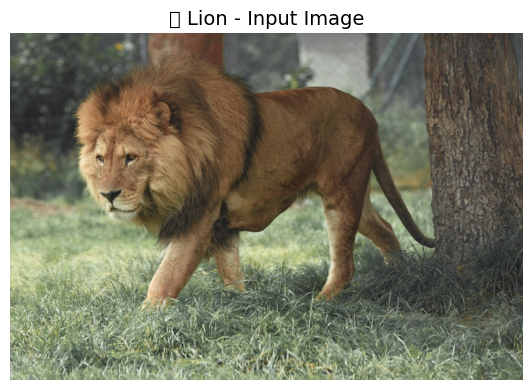


📷 Expected: Lion
----------------------------------------
   🥇 lion, king of beasts, Panthera leo: 99.8%
   🥈 tiger, Panthera tigris: 0.0%
   🥉 cougar, puma, catamount, mountain lion, painter, panther, Felis concolor: 0.0%


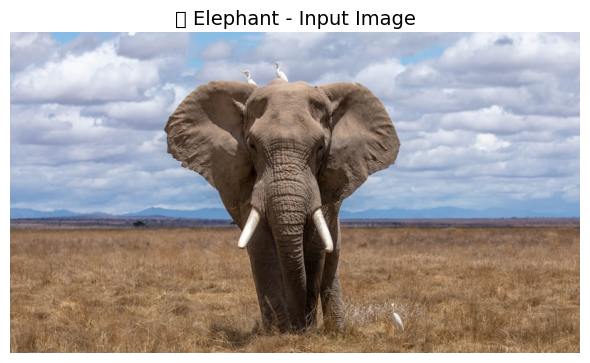


📷 Expected: Elephant
----------------------------------------
   🥇 African elephant, Loxodonta africana: 67.5%
   🥈 tusker: 30.9%
   🥉 Indian elephant, Elephas maximus: 1.3%


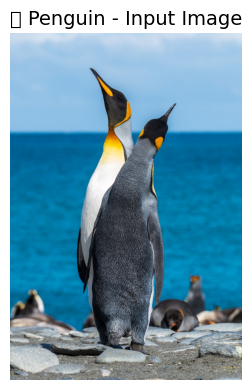


📷 Expected: Penguin
----------------------------------------
   🥇 king penguin, Aptenodytes patagonica: 99.9%
   🥈 peacock: 0.0%
   🥉 albatross, mollymawk: 0.0%


In [5]:
# Sample wildlife images
wildlife_images = {
    "Lion": "https://images.unsplash.com/photo-1546182990-dffeafbe841d?w=800",
    "Elephant": "https://images.unsplash.com/photo-1557050543-4d5f4e07ef46?w=800",
    "Penguin": "https://images.unsplash.com/photo-1551986782-d0169b3f8fa7?w=800",
}

print("🦁 Wildlife Species Identification")
print("=" * 60)

for expected_species, url in wildlife_images.items():
    try:
        # Load image
        image = load_image_from_url(url)

        # Show the image first
        show_image(image, f"🖼️ {expected_species} - Input Image", figsize=(6, 4))
        
        # Classify
        results = image_classifier(image, top_k=3)
        
        print(f"\n📷 Expected: {expected_species}")
        print("-" * 40)
        
        for i, result in enumerate(results, 1):
            emoji = "🥇" if i == 1 else "🥈" if i == 2 else "🥉"
            print(f"   {emoji} {result['label']}: {result['score']:.1%}")
            
    except Exception as e:
        print(f"   ❌ Error loading {expected_species}: {e}")

### 3.2 Visualizing Classification Results

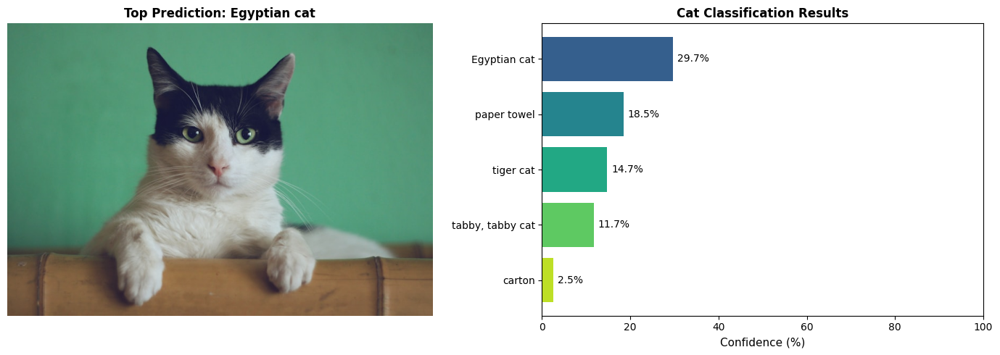

In [6]:
def visualize_classification(image, results, title="Classification Results"):
    """Visualize image with classification results as a bar chart."""
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
    
    # Show image
    ax1.imshow(image)
    ax1.axis('off')
    ax1.set_title(f"Top Prediction: {results[0]['label']}", fontsize=12, fontweight='bold')
    
    # Bar chart of predictions
    labels = [r['label'][:25] for r in results]  # Truncate long labels
    scores = [r['score'] * 100 for r in results]
    colors = plt.cm.viridis(np.linspace(0.3, 0.9, len(labels)))
    
    bars = ax2.barh(labels[::-1], scores[::-1], color=colors[::-1])
    ax2.set_xlabel('Confidence (%)', fontsize=11)
    ax2.set_title(title, fontsize=12, fontweight='bold')
    ax2.set_xlim(0, 100)
    
    # Add percentage labels
    for bar, score in zip(bars, scores[::-1]):
        ax2.text(bar.get_width() + 1, bar.get_y() + bar.get_height()/2, 
                f'{score:.1f}%', va='center', fontsize=10)
    
    plt.tight_layout()
    plt.show()

# Demo with one image
demo_url = "https://images.unsplash.com/photo-1514888286974-6c03e2ca1dba?w=800"
demo_image = load_image_from_url(demo_url)
demo_results = image_classifier(demo_image, top_k=5)

visualize_classification(demo_image, demo_results, "Cat Classification Results")

### 3.3 Batch Processing Multiple Images

In [7]:
import time

# Create a batch of images
batch_urls = [
    "https://images.unsplash.com/photo-1587300003388-59208cc962cb?w=800",  # Dog
    "https://images.unsplash.com/photo-1514888286974-6c03e2ca1dba?w=800",  # Cat
    "https://images.unsplash.com/photo-1504006833117-8886a355efbf?w=800",  # squirrel
]

# Load all images
batch_images = [load_image_from_url(url) for url in batch_urls]

# Single processing
start = time.time()
single_results = [image_classifier(img) for img in batch_images]
single_time = time.time() - start

# Batch processing  
start = time.time()
batch_results = image_classifier(batch_images)
batch_time = time.time() - start

print("⚡ Batch Processing Performance")
print("=" * 40)
print(f"📊 Processing {len(batch_images)} images")
print(f"\n⏱️ One-by-one: {single_time:.2f}s")
print(f"⏱️ Batch:      {batch_time:.2f}s")
print(f"🚀 Speedup:    {single_time/batch_time:.1f}x faster!")

print("\n📋 Batch Results:")
print("-" * 40)
for i, result in enumerate(batch_results):
    if isinstance(result, list):
        result = result[0]
    print(f"   Image {i+1}: {result['label']} ({result['score']:.1%})")

⚡ Batch Processing Performance
📊 Processing 3 images

⏱️ One-by-one: 0.02s
⏱️ Batch:      0.02s
🚀 Speedup:    1.0x faster!

📋 Batch Results:
----------------------------------------
   Image 1: Border collie (86.6%)
   Image 2: Egyptian cat (29.7%)
   Image 3: fox squirrel, eastern fox squirrel, Sciurus niger (63.1%)


---

## 4️⃣ Object Detection

Object detection identifies **multiple objects** in an image and draws **bounding boxes** around them.

### Key Concepts

| Term | Description |
|------|-------------|
| **Bounding Box** | Rectangle coordinates (x, y, width, height) |
| **Label** | Object class name (e.g., "car", "person") |
| **Confidence Score** | How sure the model is (0-1) |

### 4.1 Smart City Traffic Analysis 🚗

In [8]:
# Create object detection pipeline using DETR
object_detector = pipeline(
    "object-detection",
    model="facebook/detr-resnet-50",
    device=device
)

print("🚗 Object Detection Ready (DETR model)!")

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Using a slow image processor as `use_fast` is unset and a slow processor was saved w

🚗 Object Detection Ready (DETR model)!


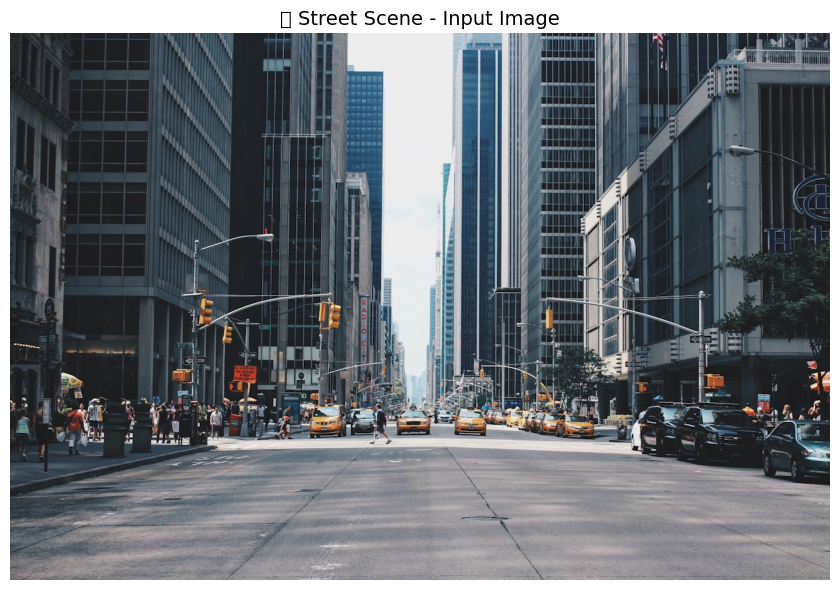

🏙️ Smart City Traffic Analysis

🔍 Found 71 objects:
----------------------------------------
   👤 person: 28
   🚦 traffic light: 21
   🚗 car: 19
   📦 handbag: 2
   📦 umbrella: 1


In [9]:
# Load a street scene image (busy street with people and vehicles)
street_url = "https://images.unsplash.com/photo-1449824913935-59a10b8d2000?w=1200"
street_image = load_image_from_url(street_url)

# Show the image first
show_image(street_image, "🖼️ Street Scene - Input Image", figsize=(10, 6))

# Detect objects
detections = object_detector(street_image)

print("🏙️ Smart City Traffic Analysis")
print("=" * 60)
print(f"\n🔍 Found {len(detections)} objects:")
print("-" * 40)

# Count objects by type
object_counts = {}
for det in detections:
    label = det['label']
    object_counts[label] = object_counts.get(label, 0) + 1

for label, count in sorted(object_counts.items(), key=lambda x: -x[1]):
    emoji_map = {'person': '👤', 'car': '🚗', 'bus': '🚌', 'truck': '🚛', 
                 'bicycle': '🚲', 'motorcycle': '🏍️', 'traffic light': '🚦'}
    emoji = emoji_map.get(label, '📦')
    print(f"   {emoji} {label}: {count}")

### 4.2 Visualizing Object Detection Results

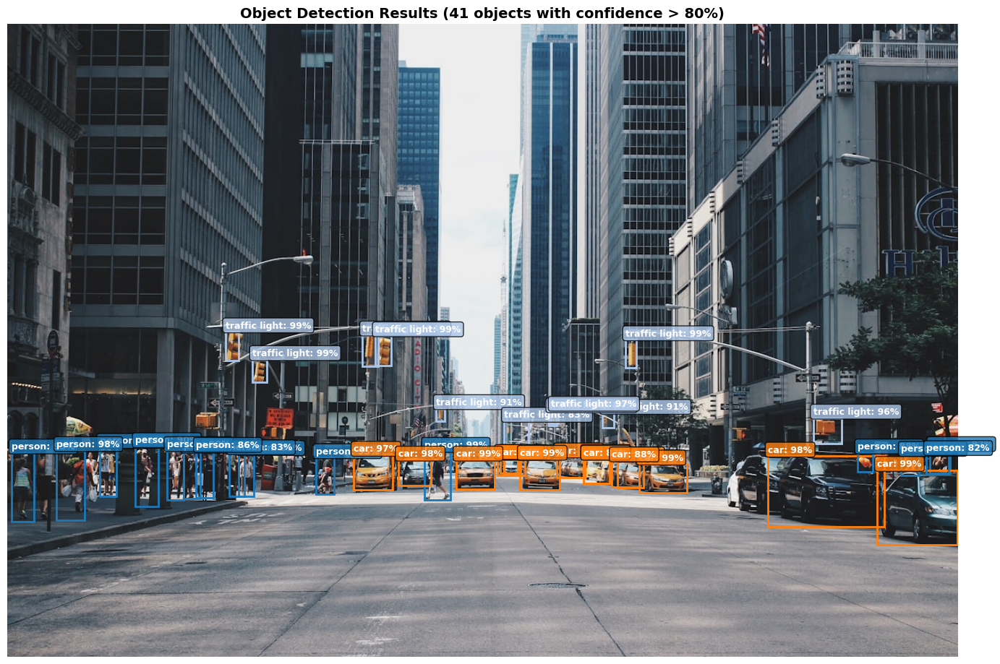

In [10]:
def visualize_detections(image, detections, confidence_threshold=0.7):
    """Draw bounding boxes on detected objects."""
    fig, ax = plt.subplots(1, figsize=(14, 10))
    ax.imshow(image)
    
    # Color map for different object types
    colors = plt.cm.tab20(np.linspace(0, 1, 20))
    label_colors = {}
    color_idx = 0
    
    filtered_count = 0
    for det in detections:
        if det['score'] < confidence_threshold:
            continue
            
        filtered_count += 1
        label = det['label']
        score = det['score']
        box = det['box']
        
        # Assign consistent color per label
        if label not in label_colors:
            label_colors[label] = colors[color_idx % len(colors)]
            color_idx += 1
        color = label_colors[label]
        
        # Draw bounding box
        x, y = box['xmin'], box['ymin']
        width = box['xmax'] - box['xmin']
        height = box['ymax'] - box['ymin']
        
        rect = patches.Rectangle((x, y), width, height, 
                                  linewidth=2, edgecolor=color, facecolor='none')
        ax.add_patch(rect)
        
        # Add label with background
        ax.text(x, y - 5, f"{label}: {score:.0%}", 
                fontsize=9, fontweight='bold',
                color='white',
                bbox=dict(boxstyle='round,pad=0.3', facecolor=color, alpha=0.8))
    
    ax.axis('off')
    ax.set_title(f"Object Detection Results ({filtered_count} objects with confidence > {confidence_threshold:.0%})", 
                fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

# Visualize with different thresholds
visualize_detections(street_image, detections, confidence_threshold=0.8)

### 4.3 Filtering Detections

In [11]:
def filter_detections(detections, labels=None, min_confidence=0.5):
    """Filter detections by label and confidence."""
    filtered = []
    for det in detections:
        if det['score'] < min_confidence:
            continue
        if labels and det['label'] not in labels:
            continue
        filtered.append(det)
    return filtered

# Example: Find only people and vehicles
vehicles_and_people = filter_detections(
    detections, 
    labels=['person', 'car', 'bus', 'truck', 'motorcycle', 'bicycle'],
    min_confidence=0.7
)

print("🚶 Filtered Results (People & Vehicles only, >70% confidence)")
print("=" * 60)
for det in vehicles_and_people:
    print(f"   {det['label']}: {det['score']:.1%}")

🚶 Filtered Results (People & Vehicles only, >70% confidence)
   person: 70.3%
   person: 74.5%
   person: 99.4%
   person: 91.3%
   car: 91.2%
   car: 98.3%
   car: 75.7%
   car: 99.2%
   person: 87.2%
   car: 92.9%
   person: 76.7%
   person: 95.4%
   person: 95.0%
   person: 87.8%
   car: 99.3%
   person: 76.1%
   car: 97.0%
   person: 81.0%
   car: 93.2%
   person: 97.9%
   person: 73.2%
   person: 86.1%
   person: 82.7%
   person: 74.9%
   car: 89.6%
   person: 73.8%
   person: 90.2%
   person: 85.9%
   car: 91.8%
   car: 82.9%
   car: 87.8%
   person: 89.7%
   car: 97.9%
   person: 82.0%
   person: 85.5%
   person: 70.3%
   car: 94.1%
   car: 98.7%
   car: 99.0%


---

## 5️⃣ Image Segmentation

Image segmentation provides **pixel-level** understanding by assigning a class to each pixel.

### Types of Segmentation

| Type | Description | Example |
|------|-------------|----------|
| **Semantic** | All pixels of same class share label | All cars = red |
| **Instance** | Each object instance has unique ID | Car1 = red, Car2 = blue |
| **Panoptic** | Combines semantic + instance | Background + individual objects |

### 5.1 Semantic Segmentation - Urban Scene Understanding 🏙️

In [12]:
# Create segmentation pipeline
segmenter = pipeline(
    "image-segmentation",
    model="nvidia/segformer-b0-finetuned-ade-512-512",
    device=device
)

print("🏙️ Semantic Segmentation Ready (SegFormer model)!")

Device set to use cuda:0


🏙️ Semantic Segmentation Ready (SegFormer model)!


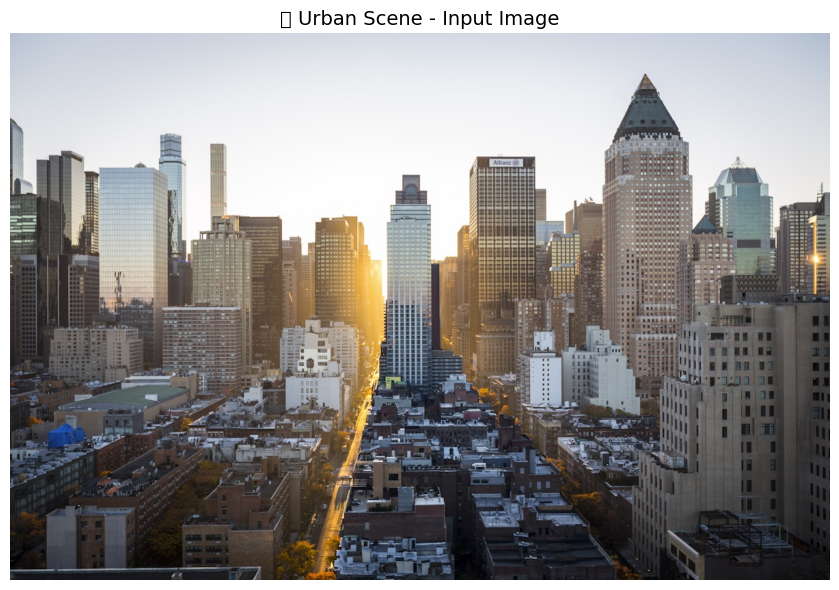

🏗️ Urban Scene Segmentation Results

🎨 Found 4 segment categories:
----------------------------------------
   🏷️ building: 64.6% of image
   🏷️ sky: 27.3% of image
   🏷️ skyscraper: 8.0% of image
   🏷️ tree: 0.0% of image


In [13]:
# Use the same street scene or load a new one
urban_url = "https://images.unsplash.com/photo-1480714378408-67cf0d13bc1b?w=1200"
urban_image = load_image_from_url(urban_url)

# Show the image first
show_image(urban_image, "🖼️ Urban Scene - Input Image", figsize=(10, 6))

# Perform segmentation
segments = segmenter(urban_image)

print("🏗️ Urban Scene Segmentation Results")
print("=" * 60)
print(f"\n🎨 Found {len(segments)} segment categories:")
print("-" * 40)

# Get image dimensions for proper percentage calculation
img_width, img_height = urban_image.size
total_pixels = img_width * img_height

# Sort by area and display
for seg in sorted(segments, key=lambda x: np.sum(np.array(x['mask']) > 0))[::-1][:10]:
    label = seg['label']
    # The mask is a PIL Image - convert and count non-zero pixels
    mask_array = np.array(seg['mask'])
    mask_pixels = np.sum(mask_array > 0)  # Count non-zero pixels
    area_pct = (mask_pixels / total_pixels) * 100
    print(f"   🏷️ {label}: {area_pct:.1f}% of image")

### 5.2 Visualizing Segmentation Masks

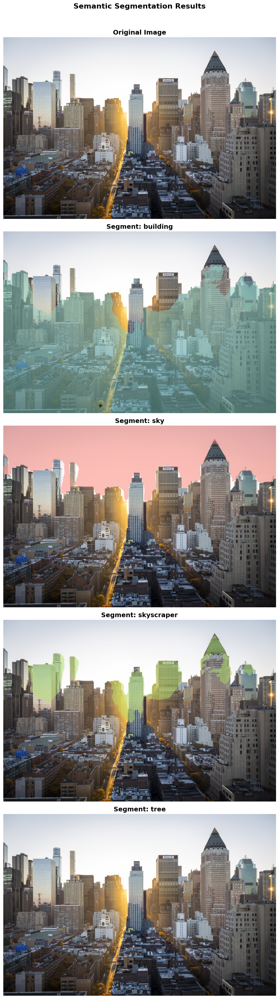

In [14]:
def visualize_segmentation(image, segments, max_segments=5):
    """Visualize segmentation masks overlaid on image."""
    # Sort by area and take top segments
    sorted_segments = sorted(segments, key=lambda x: -np.sum(np.array(x['mask']) > 0))[:max_segments]
    
    # Calculate number of rows (original + masks)
    num_images = 1 + len(sorted_segments)
    fig, axes = plt.subplots(num_images, 1, figsize=(12, 6 * num_images))
    
    # Handle case where axes is not iterable (single image)
    if num_images == 1:
        axes = [axes]
    
    # Show original
    axes[0].imshow(image)
    axes[0].set_title("Original Image", fontsize=14, fontweight='bold')
    axes[0].axis('off')
    
    # Show individual masks
    colors = plt.cm.Set3(np.linspace(0, 1, max_segments))
    
    for idx, seg in enumerate(sorted_segments):
        mask_img = seg['mask']
        # Resize mask to match image if needed
        if mask_img.size != image.size:
            mask_img = mask_img.resize(image.size)
        
        # Convert to boolean mask
        mask = np.array(mask_img) > 0
        
        # Create colored overlay
        overlay = np.array(image).copy()
        color = (np.array(colors[idx][:3]) * 255).astype(np.uint8)
        overlay[mask] = (overlay[mask] * 0.5 + color * 0.5).astype(np.uint8)
        
        axes[idx + 1].imshow(overlay)
        axes[idx + 1].set_title(f"Segment: {seg['label']}", fontsize=14, fontweight='bold')
        axes[idx + 1].axis('off')
    
    plt.suptitle("Semantic Segmentation Results", fontsize=16, fontweight='bold', y=1.01)
    plt.tight_layout()
    plt.show()

visualize_segmentation(urban_image, segments)

---

## 6️⃣ Depth Estimation

Depth estimation predicts the **distance** of each pixel from the camera, creating a depth map.

### Applications
- 🤖 Robotics navigation
- 🎮 3D reconstruction
- 📱 AR/VR experiences
- 🚗 Autonomous driving

### 6.1 Room Layout Analysis 🏠

In [15]:
# Create depth estimation pipeline
depth_estimator = pipeline(
    "depth-estimation",
    model="Intel/dpt-large",
    device=device
)

print("📏 Depth Estimation Ready (DPT model)!")

Some weights of DPTForDepthEstimation were not initialized from the model checkpoint at Intel/dpt-large and are newly initialized: ['neck.fusion_stage.layers.0.residual_layer1.convolution1.bias', 'neck.fusion_stage.layers.0.residual_layer1.convolution1.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution2.bias', 'neck.fusion_stage.layers.0.residual_layer1.convolution2.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Device set to use cuda:0


📏 Depth Estimation Ready (DPT model)!


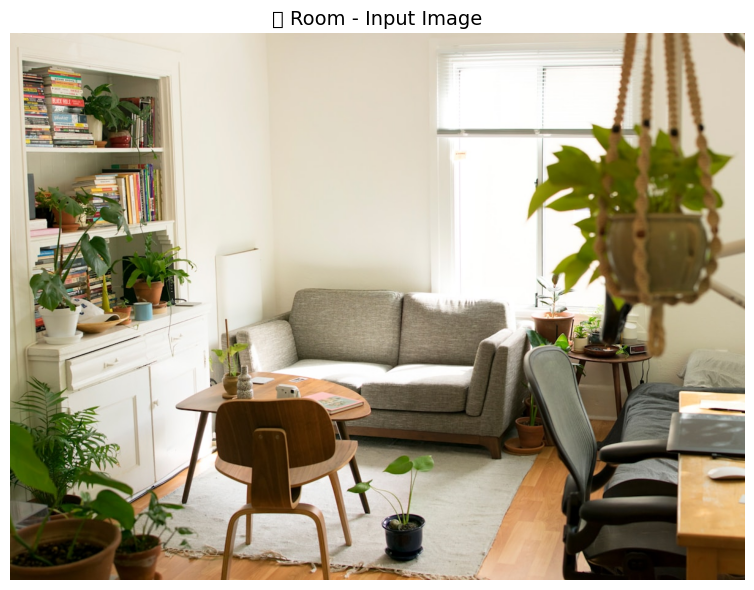

🏠 Room Layout Depth Analysis

📏 Depth estimation complete!
   • Depth map size: (1200, 893)


In [16]:
# Load a room image
room_url = "https://images.unsplash.com/photo-1502672260266-1c1ef2d93688?w=1200"
room_image = load_image_from_url(room_url)

# Show the image first
show_image(room_image, "🖼️ Room - Input Image", figsize=(10, 6))

# Estimate depth
depth_result = depth_estimator(room_image)

print("🏠 Room Layout Depth Analysis")
print("=" * 60)
print("\n📏 Depth estimation complete!")
print(f"   • Depth map size: {depth_result['depth'].size}")

### 6.2 Visualizing Depth Maps

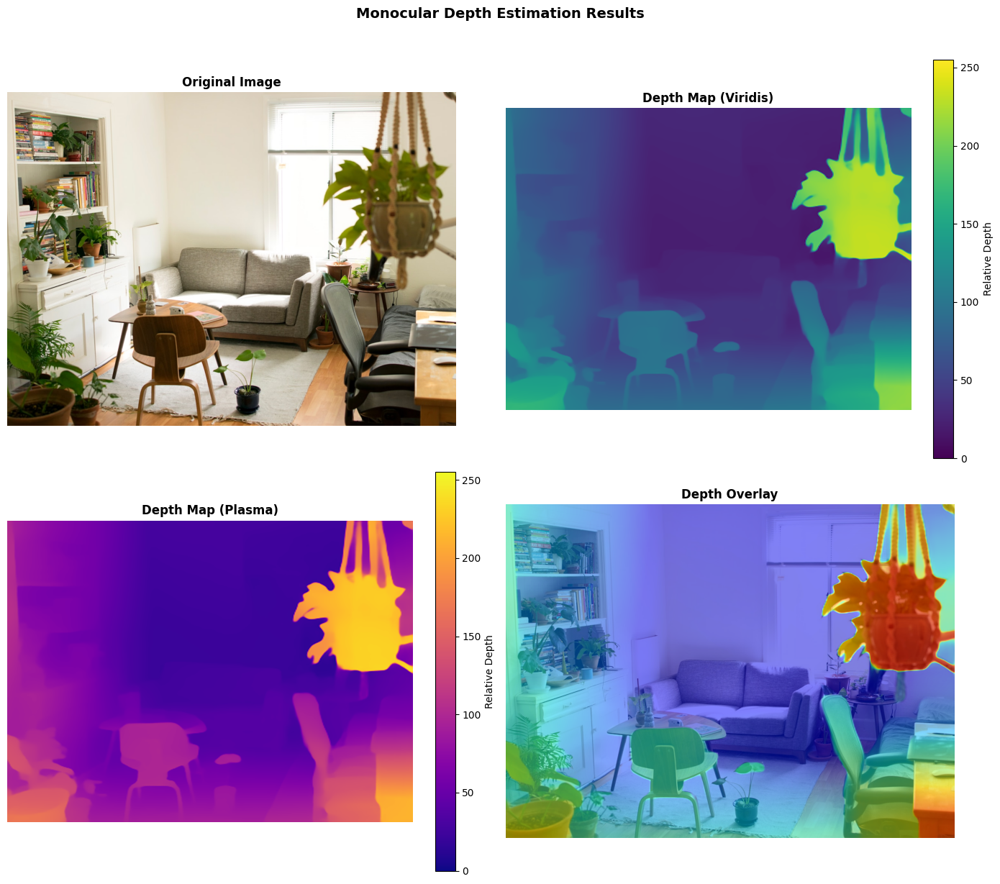

In [17]:
def visualize_depth(image, depth_result):
    """Visualize original image alongside depth map with multiple colormaps."""
    depth_map = np.array(depth_result['depth'])
    
    fig, axes = plt.subplots(2, 2, figsize=(14, 12))
    
    # Original image
    axes[0, 0].imshow(image)
    axes[0, 0].set_title("Original Image", fontsize=12, fontweight='bold')
    axes[0, 0].axis('off')
    
    # Depth map - Viridis (standard)
    im1 = axes[0, 1].imshow(depth_map, cmap='viridis')
    axes[0, 1].set_title("Depth Map (Viridis)", fontsize=12, fontweight='bold')
    axes[0, 1].axis('off')
    plt.colorbar(im1, ax=axes[0, 1], fraction=0.046, label='Relative Depth')
    
    # Depth map - Plasma (fire colors)
    im2 = axes[1, 0].imshow(depth_map, cmap='plasma')
    axes[1, 0].set_title("Depth Map (Plasma)", fontsize=12, fontweight='bold')
    axes[1, 0].axis('off')
    plt.colorbar(im2, ax=axes[1, 0], fraction=0.046, label='Relative Depth')
    
    # Depth overlay on original
    axes[1, 1].imshow(image)
    depth_normalized = (depth_map - depth_map.min()) / (depth_map.max() - depth_map.min())
    # Resize depth to match image if needed
    if depth_normalized.shape != np.array(image).shape[:2]:
        from PIL import Image as PILImage
        depth_pil = PILImage.fromarray((depth_normalized * 255).astype(np.uint8))
        depth_pil = depth_pil.resize(image.size)
        depth_normalized = np.array(depth_pil) / 255
    axes[1, 1].imshow(depth_normalized, cmap='jet', alpha=0.5)
    axes[1, 1].set_title("Depth Overlay", fontsize=12, fontweight='bold')
    axes[1, 1].axis('off')
    
    plt.suptitle("Monocular Depth Estimation Results", fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()

visualize_depth(room_image, depth_result)

### 6.3 Comparing Depth in Different Scenes

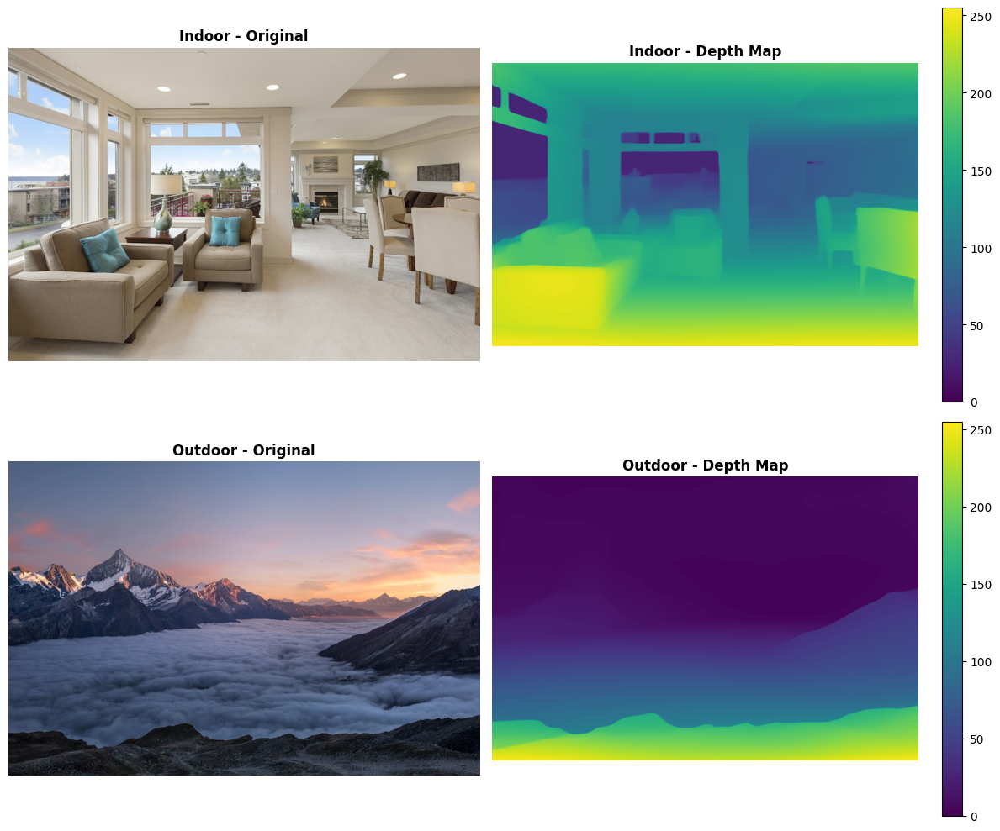

In [18]:
# Compare depth estimation across different scene types
scene_urls = {
    "Indoor": "https://images.unsplash.com/photo-1560448204-e02f11c3d0e2?w=800",
    "Outdoor": "https://images.unsplash.com/photo-1506905925346-21bda4d32df4?w=800",
}

fig, axes = plt.subplots(len(scene_urls), 2, figsize=(12, 5 * len(scene_urls)))

for idx, (scene_name, url) in enumerate(scene_urls.items()):
    try:
        # Load and process
        scene_image = load_image_from_url(url)
        depth = depth_estimator(scene_image)
        depth_map = np.array(depth['depth'])
        
        # Display
        axes[idx, 0].imshow(scene_image)
        axes[idx, 0].set_title(f"{scene_name} - Original", fontsize=12, fontweight='bold')
        axes[idx, 0].axis('off')
        
        im = axes[idx, 1].imshow(depth_map, cmap='viridis')
        axes[idx, 1].set_title(f"{scene_name} - Depth Map", fontsize=12, fontweight='bold')
        axes[idx, 1].axis('off')
        plt.colorbar(im, ax=axes[idx, 1], fraction=0.046)
        
    except Exception as e:
        print(f"❌ Error with {scene_name}: {e}")

plt.tight_layout()
plt.show()

---

## 7️⃣ Image-to-Text & Visual Question Answering

These tasks bridge vision and language:
- **Image Captioning**: Generate descriptive text for images
- **Visual QA**: Answer questions about image content

### 7.1 Art Gallery Assistant 🎨

In [19]:
# Create image-to-text pipeline
image_captioner = pipeline(
    "image-to-text",
    model="Salesforce/blip-image-captioning-base",
    device=device
)

print("🎨 Image Captioning Ready (BLIP model)!")

Device set to use cuda:0


🎨 Image Captioning Ready (BLIP model)!


🖼️ Image Captioning Demo


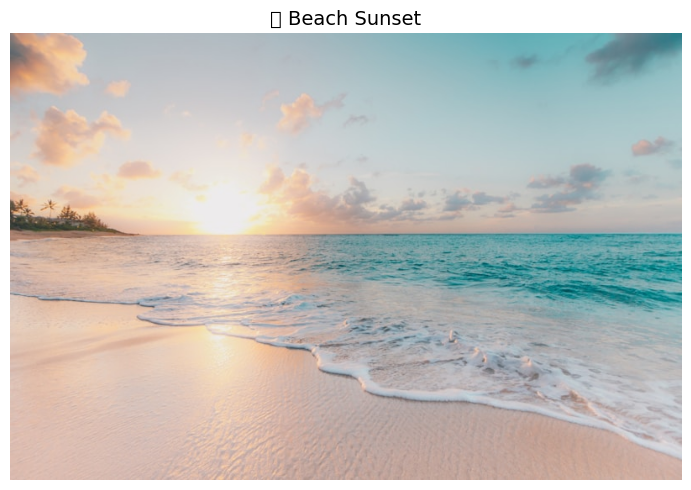


🎨 Beach Sunset
   📝 Caption: beautiful sunset on the beach in the caribbean


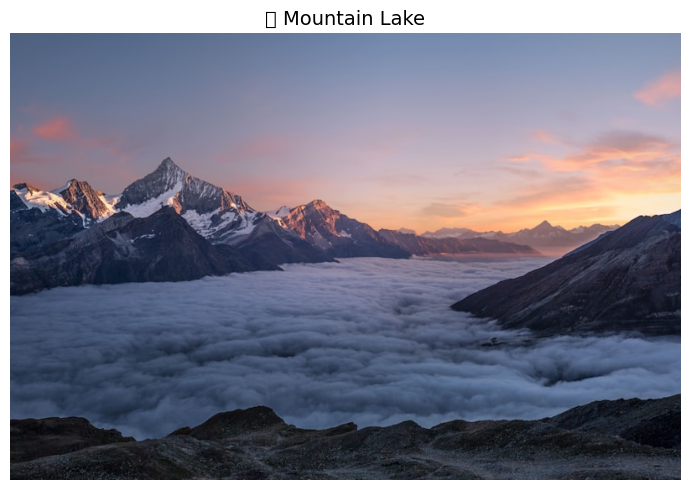


🎨 Mountain Lake
   📝 Caption: the view from the summit of mount everest at sunrise


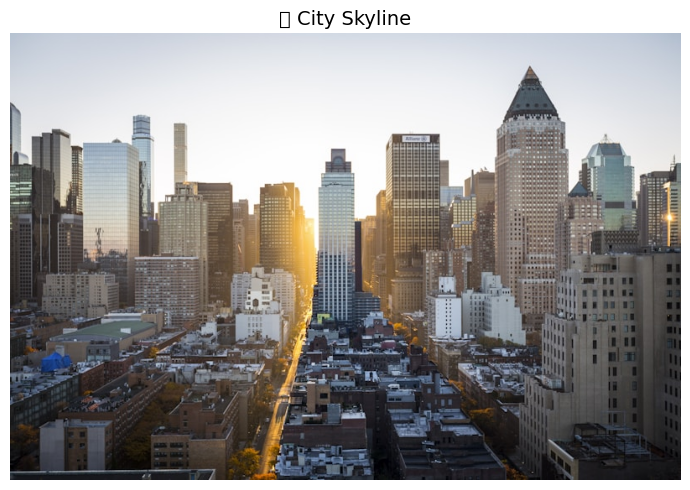


🎨 City Skyline
   📝 Caption: the sun sets over the city skyline of new york, new york, new york, new york, new york, new york, new york


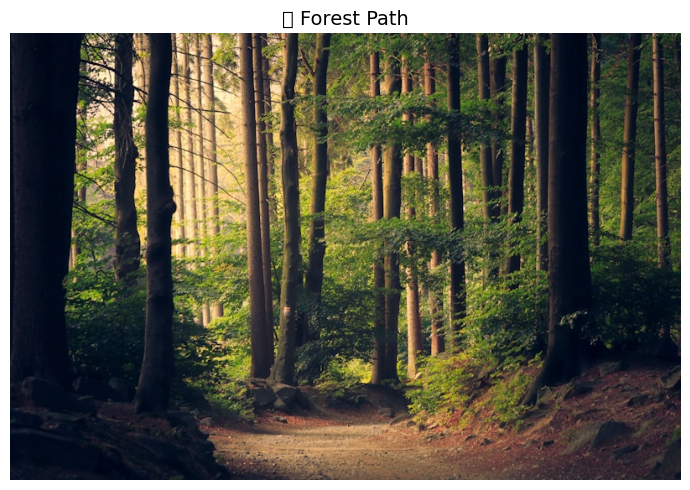


🎨 Forest Path
   📝 Caption: a path through the woods in the woods


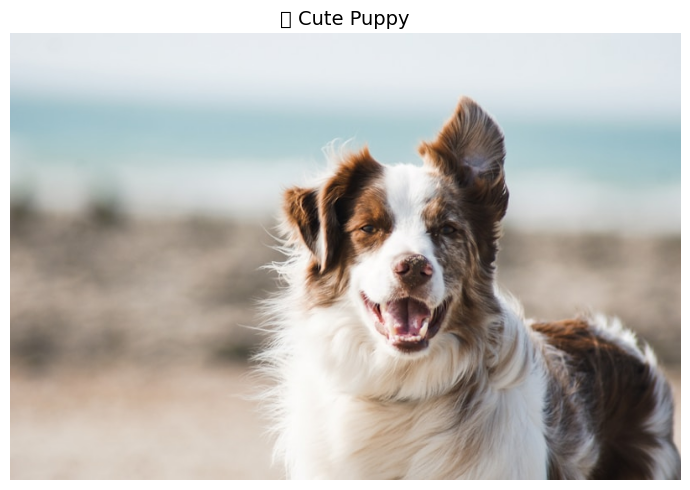


🎨 Cute Puppy
   📝 Caption: a dog standing on a beach looking at the camera


In [20]:
# Diverse images for captioning demo
artworks = {
    "Beach Sunset": "https://images.unsplash.com/photo-1507525428034-b723cf961d3e?w=800",
    "Mountain Lake": "https://images.unsplash.com/photo-1506905925346-21bda4d32df4?w=800",
    "City Skyline": "https://images.unsplash.com/photo-1480714378408-67cf0d13bc1b?w=800",
    "Forest Path": "https://images.unsplash.com/photo-1441974231531-c6227db76b6e?w=800",
    "Cute Puppy": "https://images.unsplash.com/photo-1587300003388-59208cc962cb?w=800",
}

print("🖼️ Image Captioning Demo")
print("=" * 60)

for image_name, url in artworks.items():
    try:
        image = load_image_from_url(url)
        
        # Show the image first
        show_image(image, f"🖼️ {image_name}", figsize=(8, 5))
        
        caption = image_captioner(image)[0]['generated_text']
        
        print(f"\n🎨 {image_name}")
        print(f"   📝 Caption: {caption}")
    except Exception as e:
        print(f"   ❌ Error: {e}")

### 7.2 Visual Question Answering

In [21]:
# Create VQA pipeline
vqa_pipeline = pipeline(
    "visual-question-answering",
    model="dandelin/vilt-b32-finetuned-vqa",
    device=device
)

print("❓ Visual Question Answering Ready (ViLT model)!")

Device set to use cuda:0


❓ Visual Question Answering Ready (ViLT model)!


❓ Visual Question Answering Demo


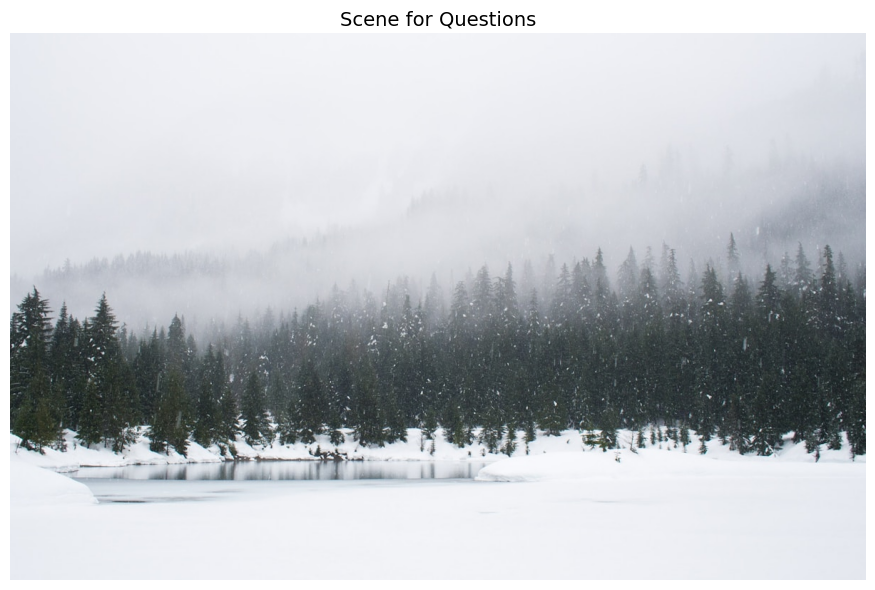


📋 Questions & Answers:
----------------------------------------

❓ Q: What season is it in this image?
   💬 A: winter (confidence: 99.3%)

❓ Q: Is there snow in the image?
   💬 A: yes (confidence: 100.0%)

❓ Q: What color is the sky?
   💬 A: gray (confidence: 97.5%)

❓ Q: Are there any people visible?
   💬 A: no (confidence: 90.0%)

❓ Q: What type of activity might happen here?
   💬 A: skiing (confidence: 67.5%)


In [22]:
# Load a scene image for VQA
scene_url = "https://images.unsplash.com/photo-1491002052546-bf38f186af56?w=1200"
scene_image = load_image_from_url(scene_url)

# Questions about the scene
questions = [
    "What season is it in this image?",
    "Is there snow in the image?",
    "What color is the sky?",
    "Are there any people visible?",
    "What type of activity might happen here?",
]

print("❓ Visual Question Answering Demo")
print("=" * 60)

# Show the image
show_image(scene_image, "Scene for Questions", figsize=(10, 6))

print("\n📋 Questions & Answers:")
print("-" * 40)

for question in questions:
    answer = vqa_pipeline(image=scene_image, question=question)
    print(f"\n❓ Q: {question}")
    print(f"   💬 A: {answer[0]['answer']} (confidence: {answer[0]['score']:.1%})")

---

## 📊 Summary & Comparison

### Quick Reference: CV Tasks

| Task | Pipeline | Best For | Output |
|------|----------|----------|--------|
| **Classification** | `image-classification` | Single object identification | Label + confidence |
| **Detection** | `object-detection` | Multiple objects with locations | Bounding boxes + labels |
| **Segmentation** | `image-segmentation` | Pixel-level understanding | Masks |
| **Depth** | `depth-estimation` | 3D scene understanding | Depth map |
| **Captioning** | `image-to-text` | Accessibility, search | Text description |
| **VQA** | `visual-question-answering` | Interactive assistants | Answers |

### Choosing the Right Task

```
What's in this image?
├── Need just a label? → Image Classification
├── Need locations too? → Object Detection  
├── Need pixel-level detail? → Image Segmentation
├── Need 3D understanding? → Depth Estimation
├── Need text description? → Image Captioning
└── Have specific questions? → Visual QA
```

---

## 🎯 Key Takeaways

1. **Vision Transformers (ViT)** process images as sequences of patches, enabling powerful attention mechanisms

2. **Hugging Face pipelines** make it easy to perform complex CV tasks with just a few lines of code

3. **Task selection** depends on your needs:
   - Classification → "What is this?"
   - Detection → "What and where?"
   - Segmentation → "Which pixels belong to what?"
   - Depth → "How far away?"

4. **Pre-trained models** on Hugging Face Hub cover diverse use cases and can be fine-tuned for specific needs

5. **Batch processing** significantly improves performance when processing multiple images

---

## 🔗 Resources

- [Hugging Face Computer Vision Course](https://huggingface.co/learn/computer-vision-course)
- [Vision Transformer (ViT) Paper](https://arxiv.org/abs/2010.11929)
- [DETR: End-to-End Object Detection](https://arxiv.org/abs/2005.12872)
- [SegFormer: Semantic Segmentation](https://arxiv.org/abs/2105.15203)
- [Hugging Face Models Hub - Vision](https://huggingface.co/models?pipeline_tag=image-classification)